In [1]:
%matplotlib inline

# データの説明
・kaggleに掲載されたランジェリーデータセット。 <br>
https://www.kaggle.com/PromptCloudHQ/innerwear-data-from-victorias-secret-and-others
<br>
・2017年6月から2017年7月にかけECサイトからデータ抽出した。<br>
<br>
分析対象となるECサイトとブランド<br>
・Victoria's Secret：公式サイト、Amazon<br>
・Wacoal(Btemptd)：公式サイト、Amazon、Macy's<br>
・Calvin Klein：公式ウェブサイト、Amazon、Macy's<br>
・Hanky Panky：公式ウェブサイト、Amazon、Macy's<br>
・Topshop USA

# ブランドのヒストリー

## Victoria's Secret
<img src="https://media3.picsearch.com/is?lPV6VtKgHcfq5RYxq6rtq7JSGoiwaruqB8IJP1Jgw2o&height=256" width="100px">
<br>
売上世界第4位のアパレルチェーン企業「リミテッド・ブランズ」社の傘下で2013年は、北アメリカに総数1045の店舗を展開、年商6403億円。<br>
店舗はピンクを基調としたセクシーなデザインで、下着や水着をはじめとする同社の取り扱い商品の多くはセクシー路線を特徴とする。<br>
ファッションショーやカタログ通信販売に力を入れており、これらにトップモデルを登場させるスタイルも話題を呼んでいる。<br>
最近は売り上げは低迷し、そのセクシー過ぎる広告は顧客を遠ざけている。<br>
1977年にロイ・レイモンドによってサンフランシスコに設立された。<br>
レイモンドは1982年にこの会社をリミテッド・ブランズに売却し、その傘下に入った。<br>
北アメリカを中心に多くの店舗を有しているものの、主流はカタログ通信販売となっている。

## ワコール(b.tempt'd)
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/2/24/Wacoal_logo.svg/150px-Wacoal_logo.svg.png" width="100px">
<br>
京都市に本拠を置く、日本の衣料品メーカーで事業の中心は、女性用下着販売。<br>
アメリカでb.tempt'dとういブランドを展開している。<br>
フィット感やサポートを売りにしている。

## Calvin Klein
<img src="https://media5.picsearch.com/is?Ls8Atn2b9yB2IZBEJihdUt8BQd438st-EV1AgmGdycs&height=320" width="100px">
Kleinは1964年にニューヨークのファッション工科大学を卒業し、自身の会社を設立した。<br>
彼の名前のブランドの下着は、エキゾチックなポーズでほぼ裸のモデルをフィーチャーした看板とプリント広告に助けられて、1980年代にヒットした。<br>
クラインは後に他の製品、特に香水に力を入れた。<br>
2002年に彼の会社はPhillips-Van Heusen Corporationに買収された。

## Hanky Panky
<img src="http://www.hankypanky-store.jp/design/ONME005973/footer/about_hp/hankypankylogo.gif" width="100px">
アンダーウェアの概念を超えた豊富なカラーバリエーションはベーシックカラーに加え、シーズンごとに発表される鮮やかなカラーも大きな魅力。<br>
大学教授だったLida Orzeckは、働く女性＝パンツスタイルで威厳を保つという時代だった当時、パンツスーツを愛用し教壇に立っていた。<br>
そんな彼女の悩みは、黒板に向かう後姿のパンティライン。<br>
視線が気になりＧストリングスというラインが出ない下着を着用していましたが、食い込んでしまいとても不快…。<br>
この悩みを友人Gale Epsteinに打ち明けたところ、器用な彼女は快適なはき心地でラインが響かないアンダーウェアをハンカチを用いて手作りでプレゼントしてあげた。<br>
その後、評判が広まりリクエストの声が高まったため２人は１９７７年に“Hanky Panky”を創設した。

## Topshop
<img src="https://www.topshop.com/assets/topshop/images/logo.svg?version=19102018" width="100px">
世界20カ国以上で展開するイギリスのファッション小売店。<br>
低価格かつファッション性の高い服、いわゆるファストファッション。<br>
日本企業もファストファッションの事業モデルを取り入れるようになっており、日本での人気は低迷し撤退している。

# 可視化する事
・各ブランドの最大小売価格(MRP)の範囲は？<br>
・最も高価な商品は？<br>
・商品カテゴリ毎の各ブランドの最大小売価格(MRP)の範囲は？<br>
・ブランド間で展開している色の範囲は？<br>
・商品カテゴリ毎の色の範囲は？<br>
・ブランド間での評価は？<br>
・商品カテゴリ毎のブランド間での評価は？<br>
・最も割引されているブランドは何か？<br>
・商品カテゴリ毎に最も割引されているブランドは何か？<br>
・どの商品カテゴリが他の商品カテゴリよりレビューされているか？<br>
・どの製品のレビューが最も少ないか？<br>
・各ブランドでサポートされている一般的でユニークな色は何か？<br>
・レビューに基づいた一般的な消費者の感情は何か？

# 簡易な確認

In [2]:
import csv
import pandas as pd
import seaborn as sns
import matplotlib as plt
from matplotlib import pyplot as pyplt
import numpy as np
import matplotlib
import codecs
import json
import requests

In [6]:
def describe_dataset(df):
    print(df.iloc[0]["retailer"])
    print("Number of rows: %d" %(df.shape[0]))
    display(df.head(1))

In [7]:
pd.set_option("display.max_rows", 101)

In [8]:
df_list=[]

aerie_df = pd.read_csv("./input/ae_com.csv")
aerie_df['ec_site'] = 'aerie'
aerie_df['official'] = '1'
df_list.append(aerie_df)

calvin_klein_df  = pd.read_csv("./input/calvinklein_com.csv")
calvin_klein_df['ec_site'] = 'calvin_klein'
calvin_klein_df['official'] = '1'
df_list.append(calvin_klein_df)

amazon_df = pd.read_csv("./input/amazon_com.csv")
amazon_df['ec_site'] = 'amazon'
amazon_df['official'] = '0'
df_list.append(amazon_df)

btempted_df  = pd.read_csv("./input/btemptd_com.csv")
btempted_df['ec_site'] = 'wacoal'
btempted_df['official'] = '1'
df_list.append(btempted_df)

hanky_panky_df  = pd.read_csv("./input/hankypanky_com.csv")
hanky_panky_df['ec_site'] = 'hanky_panky'
hanky_panky_df['official'] = '1'
df_list.append(hanky_panky_df)

macys_df = pd.read_csv("./input/macys_com.csv")
macys_df['ec_site'] = 'macys'
macys_df['official'] = '0'
df_list.append(macys_df)

nordstrom_df  = pd.read_csv("./input/shop_nordstrom_com.csv")
nordstrom_df['ec_site'] = 'nordstrom'
nordstrom_df['official'] = '1'
df_list.append(nordstrom_df)

topshop_df  = pd.read_csv("./input/us_topshop_com.csv")
topshop_df['ec_site'] = 'topshop'
topshop_df['official'] = '1'
df_list.append(topshop_df)

victoriassecret_df  = pd.read_csv("./input/victoriassecret_com.csv")
victoriassecret_df['ec_site'] = 'victoriassecret'
victoriassecret_df['official'] = '1'
df_list.append(victoriassecret_df)

In [9]:
merged_df = pd.DataFrame()

for df in df_list:
    merged_df = merged_df.append(df)

In [10]:
merged_df.columns

Index(['product_name', 'mrp', 'price', 'pdp_url', 'brand_name',
       'product_category', 'retailer', 'description', 'rating', 'review_count',
       'style_attributes', 'total_sizes', 'available_size', 'color', 'ec_site',
       'official'],
      dtype='object')

In [11]:
for df in df_list:
    describe_dataset(df)

Ae US
Number of rows: 28328


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,Aerie Everyday Loves Lace Cheeky,12.50 USD,12.50 USD,https://www.ae.com/aerie-everyday-loves-lace-c...,AERIE,Cheekies,Ae US,Introducing Everyday Loves™: Made with love. E...,5.0,8.0,"[""Soft lace with the right amount of stretch"",...","[""XS"", ""S"", ""M"", ""L"", ""XL"", ""XXL""]","[""XS"", ""S"", ""M"", ""L"", ""XL"", ""XXL""]",Rugged Green,aerie,1


Calvin Klein US
Number of rows: 4747


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,logo cotton stretch thong,$13.00,$13.00,http://www.calvinklein.us/en/womens-clothing/w...,Calvin Klein,3 FOR 33 PANTY ESSENTIALS,Calvin Klein US,soft cotton stretch fabric and a metallic logo...,NaN,NaN,"[""cotton stretch thong panty"",""metallic elasti...","s,m,l","s,m,l",BLACK,calvin_klein,1


Amazon US
Number of rows: 31612


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,Calvin Klein Women's Sheer Marquisette Demi Un...,$36.00,$32.40,https://www.amazon.com/-/dp/B01NAVD98J?th=1&psc=1,Calvin-Klein,Bras,Amazon US,"An unlined demi cup bra featuring sheer, sexy ...",4.5,47,"[ 72% Nylon, 28% Elastane , Imported , hook an...","30B , 30C , 30D , 30DD , 32A , 32B , 32C , 32D...","30B , 30C , 30D , 30DD , 32B , 32C , 32D , 32D...",Bare,amazon,0


Btemptd US
Number of rows: 3518


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,b.tempt'd Ciao Bella Bralette,$30.00,$30.00,http://btemptd.wacoal-america.com/b-tempt-d-ci...,WACOAL,COLLECTIONS,Btemptd US,Say “buongiorno!” to this ladylike piece that ...,NaN,NaN,[Wire free bralette • Cut and sew corded lace ...,"XS,S,M,L,XL","l,m,s,xl,xs",Bridal White,wacoal,1


Hankypanky US
Number of rows: 35005


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,Silky 20” A-line Half Slip with Lace,$68,$68,http://www.hankypanky.com/collections/silky-20...,HankyPanky,Collections,Hankypanky US,Hanky Panky Silky is the ideal fabric for unde...,NaN,NaN,"[""Just above-the-knee-length half-slip with el...","[""Select"", ""S"", ""M"", ""L"", ""XL""]","[""Select"", ""S"", ""M"", ""L"", ""XL""]",Black,hanky_panky,1


Macys US
Number of rows: 40897


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,ID String Bikini QF1754,$20.00,$20.00,http://www1.macys.com/shop/product/calvin-klei...,Calvin Klein,Women - Lingerie & Shapewear - Designer Lingerie,Macys US,The perfect amount of coverage in a subtle sil...,NaN,NaN,"[""Thin elastic waistband "", ""Repeating logo at...","[""XS"", ""S"", ""M"", ""L"", ""XL""]","[""XS"", ""S"", ""M"", ""L"", ""XL""]",Black,macys,0


Nordstrom US
Number of rows: 12568


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,'B Fitting' High Cut Briefs,$15.00,$15.00,http://shop.nordstrom.com/s/wacoal-b-fitting-h...,WACOAL,Women's Panties,Nordstrom US,"Lighter-than-air, full-cut Supima® cotton brie...",4.2,65.0,"[""79% Supima® cotton, 21% spandex."", ""Hand was...",[nil],[nil],Black,nordstrom,1


Topshop US
Number of rows: 3082


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,MATERNITY Criss Cross Knickers,$20.00,$20.00,http://www.topshop.com/en/tsus/product/clothin...,US TOPSHOP,Lingerie,Topshop US,These feminine black knickers for maternity fe...,NaN,NaN,NaN,"4,6,8,10,12","4,6,8,10,12",BLACK,topshop,1


Victoriassecret US
Number of rows: 453386


,product_name,mrp,price,pdp_url,brand_name,product_category,retailer,description,rating,review_count,style_attributes,total_sizes,available_size,color,ec_site,official
0,Very Sexy Strappy Lace Thong Panty,$14.50,$14.50,https://www.victoriassecret.com/panties/shop-a...,Victoria's Secret,Strappy Lace Thong Panty,Victoriassecret US,"Lots of cheek peek, pretty lace, a strappy bac...",NaN,NaN,NaN,"[""XS"", ""S"", ""M"", ""L"", ""XL""]",S,peach melba,victoriassecret,1


# データの前処理(クレンジング)

## 通貨の表記を統一<br>
・mrp　: 最大小売価格<br>
・price : 販売価格

In [12]:
import re

colon_to_dollar_conversion_rate = 0.0017
ind_rp_to_dollar_conversion_rate = 0.000066

def extract_usd_value(value_str):
    if type(value_str) is str:
        value_str= value_str.strip().lower().replace('usd', '').replace('$','').replace("\-.*","").strip()
        value_str = re.sub(r"-.*", "", value_str)
        value_str = re.sub(r"–.*", "", value_str)
        value_str = re.sub(r"\s.*", "", value_str)
        value_str.strip()
        
        if "₡" in value_str:
            value_str = value_str.replace("₡", "").strip()
            value_str = pd.to_numeric(value_str) * colon_to_dollar_conversion_rate            
        elif "rp" in value_str:
            value_str = value_str.replace("rp", "").strip()
            value_str = pd.to_numeric(value_str) * ind_rp_to_dollar_conversion_rate                
            
        return value_str
    else:
        return value_str
    
merged_df['mrp']=merged_df['mrp'].apply(extract_usd_value).apply(pd.to_numeric)
merged_df['price']=merged_df['price'].apply(extract_usd_value).apply(pd.to_numeric)

## ブランド名の表記を変更<br>

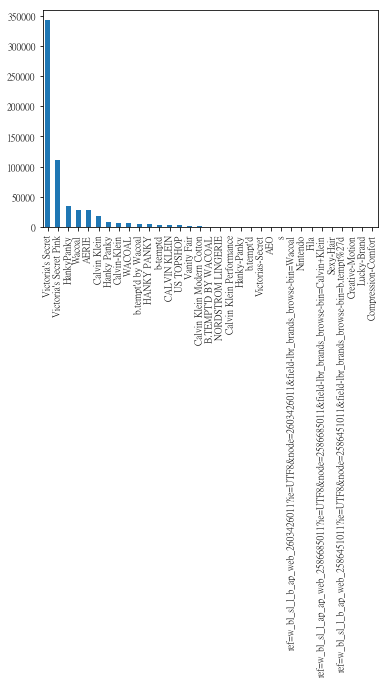

In [13]:
pd.value_counts(merged_df['brand_name']).plot.bar()

In [14]:
def standardize_brand_names(brand_name):
    brand_name = brand_name.lower()
    brand_name = brand_name.replace("-", " ")
    
    if "hanky" in brand_name:
        brand_name = "hanky panky"
    elif "calvin" in brand_name:
        brand_name = "calvin klein"
    elif "wacoal" in brand_name or "tempt" in brand_name:
        brand_name = "b.tempt'd"
    elif "victorias" in brand_name:
        brand_name = "victoria's secret"
    elif "aeo" in brand_name:
        brand_name = "aerie"
    brand_name = brand_name.strip()
    return brand_name
merged_df['brand_name'] = merged_df['brand_name'].apply(standardize_brand_names)

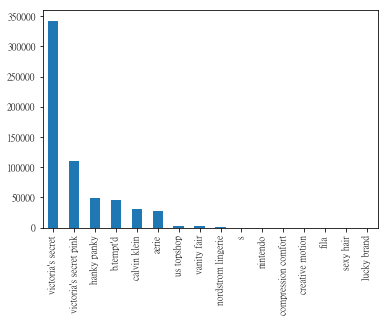

In [15]:
pd.value_counts(merged_df['brand_name']).plot.bar()

In [16]:
pd.value_counts(merged_df['brand_name'])

victoria's secret         342600
victoria's secret pink    110853
hanky panky                48302
b.tempt'd                  45273
calvin klein               31251
aerie                      28328
us topshop                  3082
vanity fair                 2575
nordstrom lingerie           870
s                              3
nintendo                       1
compression comfort            1
creative motion                1
fila                           1
sexy hair                      1
lucky brand                    1
Name: brand_name, dtype: int64

### 考察
Nintendo、Sexy HairとSはおかしなブランド名で、 おそらくAmazonのデータセットだろう。<br>
Victoria's Secretのデータセットは他のブランドよりはるかに大きい。<br>
ただし、すべてのデータセットは、一定期間内に個々の小売業者のWebページから抽出されたものだ。<br>
したがって、より大きなデータセットは次のように説明できます。<br>
<br>
・より大きな在庫があある。<br>
・Amazonが自社ブランドを販売している。<br>
・件数の少ない(100件未満)ブランドは有益でないため削除する。

In [17]:
MIN_RECORDS = 100

for item in pd.value_counts(merged_df['brand_name']).iteritems():
    brand = item[0]
    count = item[1]
    
    if(count < MIN_RECORDS):
        merged_df.drop(merged_df[merged_df.brand_name == brand].index, inplace=True) 

In [18]:
pd.value_counts(merged_df['brand_name'])

victoria's secret         342594
victoria's secret pink    110850
hanky panky                48286
b.tempt'd                  45271
calvin klein               31246
aerie                      28322
us topshop                  3081
vanity fair                 2574
nordstrom lingerie           870
Name: brand_name, dtype: int64

## 商品カテゴリを確認

In [19]:
product_categories = pd.value_counts(merged_df['product_category'])
print("There are %d categories! "% (product_categories.shape[0]))

There are 525 categories! 


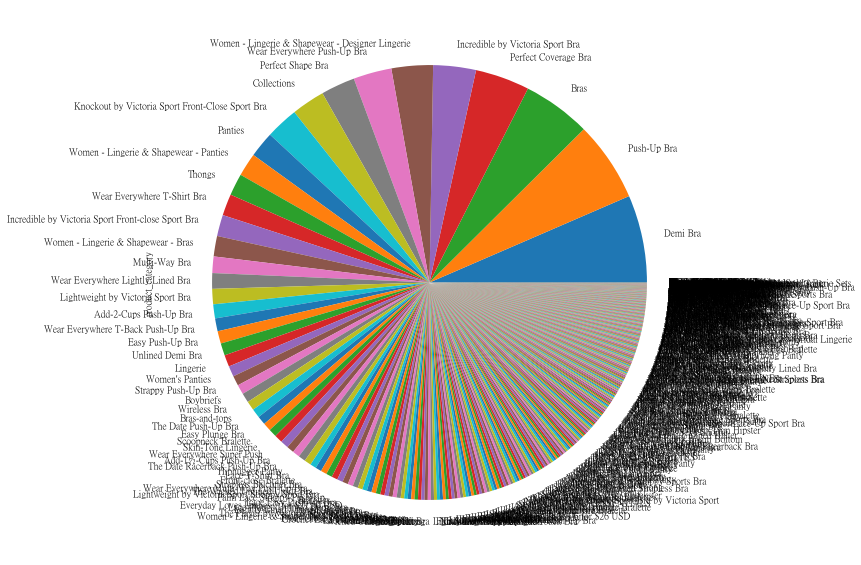

In [20]:
product_categories.plot.pie(figsize=(10,10))

### 商品のカテゴリが多すぎるため大きなカテゴリを作成

In [21]:
categories = {
    "bra" : ["bra", "push-up", "classic", "tomgirl", "collections", "longline", "bridget", "hannah", "audrey", "lorna jane", "katie", "brooke", "push", "padded", "demi", "scoop", "full coverage", "wireless", "plunge"],
    "panty" : ["panty", "panties", "brief", "hiphugger","cheekies", "thong", "hipster", "cheekster", "short", "bottom", "undies"],
    "bikini" : ["bikini", "triangle", "one-piece", "one piece", "high-neck", "hineck"],
    "top" : ["tee", "top", "tank", "halter", "bandeau", "racerback", "cami", "crop"],
    "lingerie": ["slip", "garter", "babydoll", "lingerie", "teddy", "sleepwear", "fishnet", "robe", "kimono", "bodysuit", "romper", "tunic"],
    "shapewear": ["shapewear", "bustier"],
    "socks" : ["sock"],
    "leggings": ["legging"],
    "bottle": ["bottle"],
    "hoodie" : ["full-zip"],
    "kit" : ["kit", "duffle"],
    "petal": ["petal"]
}

In [22]:
def standardize_product_category(row):
    product_category = row["product_category"]
    product_name = row["product_name"]
    
    product_name = product_name.lower()
    product_category = product_category.lower()
    for group, items in categories.items():
        for item in items:
            if item in product_category:
                return group

    for group, items in categories.items():
        for item in items:
            if item in product_name:
                return group

    return product_category

bra                   436367
panty                 124253
lingerie               39247
top                     6077
bikini                  5775
shapewear               1019
hoodie                    93
socks                     82
leggings                  66
bottle                    39
baseball hat              27
petal                     22
kit                       18
washed canvas tote         9
Name: product_group, dtype: int64

There are 14 categories! 


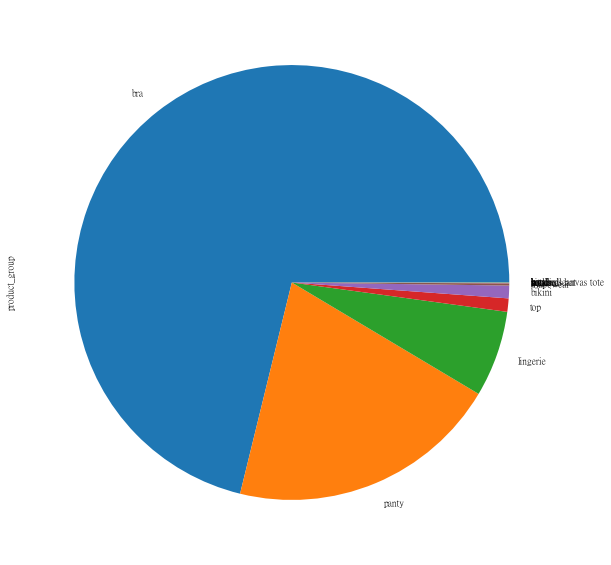

In [23]:
merged_df["product_group"] = merged_df.apply(standardize_product_category, axis=1)

product_group = pd.value_counts(merged_df['product_group'])
display(product_group)
print("There are %d categories! "% (product_group.shape[0]))
product_group.plot.pie(figsize=(10,10))

In [24]:
merged_df['product_group'].value_counts(dropna=False, normalize=True)

bra                   0.711746
panty                 0.202665
lingerie              0.064015
top                   0.009912
bikini                0.009419
shapewear             0.001662
hoodie                0.000152
socks                 0.000134
leggings              0.000108
bottle                0.000064
baseball hat          0.000044
petal                 0.000036
kit                   0.000029
washed canvas tote    0.000015
Name: product_group, dtype: float64

### 考察
・商品カテゴリはTop5で99%を占める。<br>
・件数の少ない(1,000件未満)カテゴリは有益でないため削除する。<br>

<table>
  <tr>
    <th style="text-align:left;">位</th>
    <th style="text-align:left;">英名</th>
    <th style="text-align:left;">和名</th>
    <th style="text-align:left;">件数</th>
    <th style="text-align:left;">割合</th>
    <th style="text-align:left;">累積</th>
  </tr>
  <tr>
    <th style="text-align:left;">1</th>
    <th style="text-align:left;">bra</th>
    <th style="text-align:left;">ブラ</th>
    <th style="text-align:left;">436,394</th>
    <th style="text-align:left;">0.71</th>
    <th style="text-align:left;">0.71</th>
  </tr>
  <tr>
    <th style="text-align:left;">２</th>
    <th style="text-align:left;">panty</th>
    <th style="text-align:left;">パンティ</th>
    <th style="text-align:left;">124,270</th>
    <th style="text-align:left;">0.20</th>
    <th style="text-align:left;">0.91</th>
  </tr>
   <tr>
    <th style="text-align:left;">3</th>
    <th style="text-align:left;">lingerie</th>
    <th style="text-align:left;">ランジェリー</th>
    <th style="text-align:left;">39,252</th>
    <th style="text-align:left;">0.06</th>
    <th style="text-align:left;">0.97</th>
  </tr>
  <tr>
    <th style="text-align:left;">4</th>
    <th style="text-align:left;">top</th>
    <th style="text-align:left;">トップ</th>
    <th style="text-align:left;">6,077</th>
    <th style="text-align:left;">0.01</th>
    <th style="text-align:left;">0.98</th>
  </tr>   
  <tr>
    <th style="text-align:left;">5</th>
    <th style="text-align:left;">bikini</th>
    <th style="text-align:left;">ビキニ</th>
    <th style="text-align:left;">5,775</th>
    <th style="text-align:left;">0.01</th>
    <th style="text-align:left;">0.99</th>
  </tr>  
  <tr>
    <th style="text-align:left;">6</th>
    <th style="text-align:left;">shapewear</th>
    <th style="text-align:left;">矯正下着</th>
    <th style="text-align:left;">1,019</th>
    <th style="text-align:left;">0.00</th>
    <th style="text-align:left;">0.99</th>
  </tr> 
</table>

In [25]:
MIN_RECORDS = 1000

for item in product_group.iteritems():
    category = item[0]
    count = item[1]
    
    if(count < MIN_RECORDS):
        merged_df.drop(merged_df[merged_df.product_group == category].index, inplace=True)

bra          436140
panty        124123
lingerie      39141
top            6069
bikini         5768
shapewear      1016
Name: product_group, dtype: int64

There are 6 categories! 


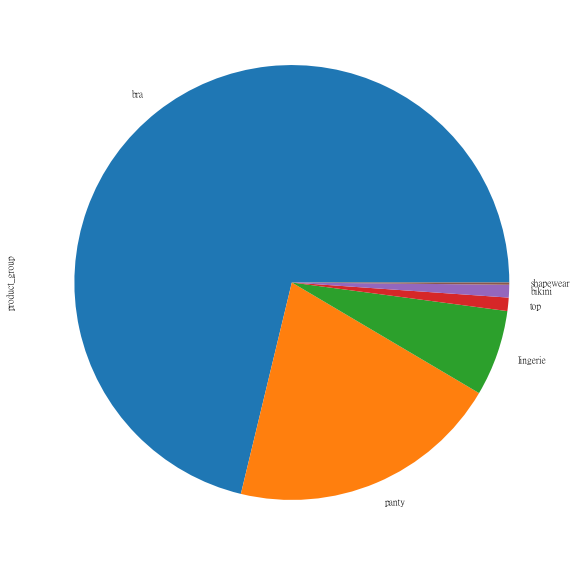

In [26]:
merged_df["product_group"] = merged_df.apply(standardize_product_category, axis=1)

product_group = pd.value_counts(merged_df['product_group'])
display(product_group)
print("There are %d categories! "% (product_group.shape[0]))
product_group.plot.pie(figsize=(10,10))

In [107]:
merged_df_official = merged_df[merged_df['official'].isin(['1'])]
merged_df_not_official = merged_df[merged_df['official'].isin(['0'])]

# 商品名のトピック分析

In [61]:
import gensim
import numpy as np
from collections import Counter
from sklearn import datasets
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [75]:
with open("stopwords.txt") as f:
    stopwords = f.read()
    stopwords = stopwords.split()

## 全データの商品名のトピック分析

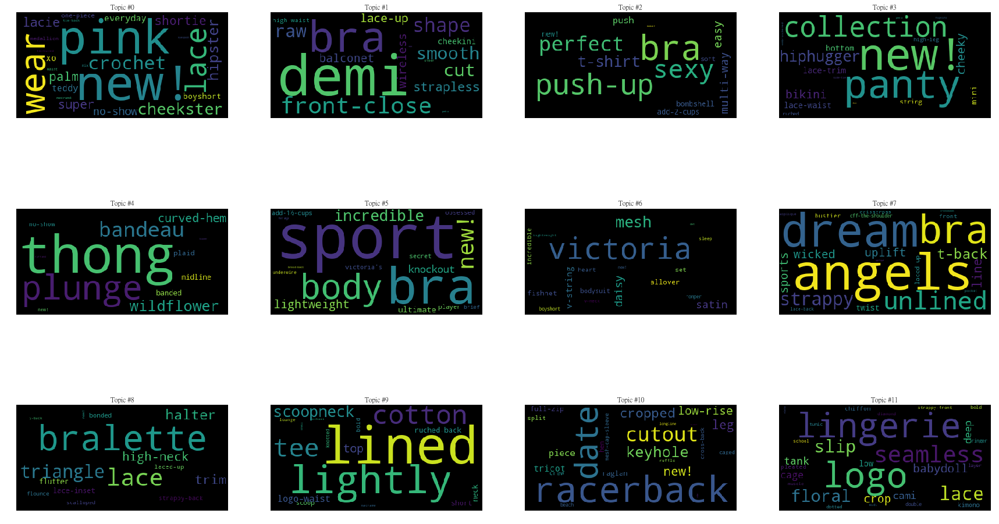

In [91]:
docs = merged_df["product_name"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Victoria's Secretの商品名のトピック分析

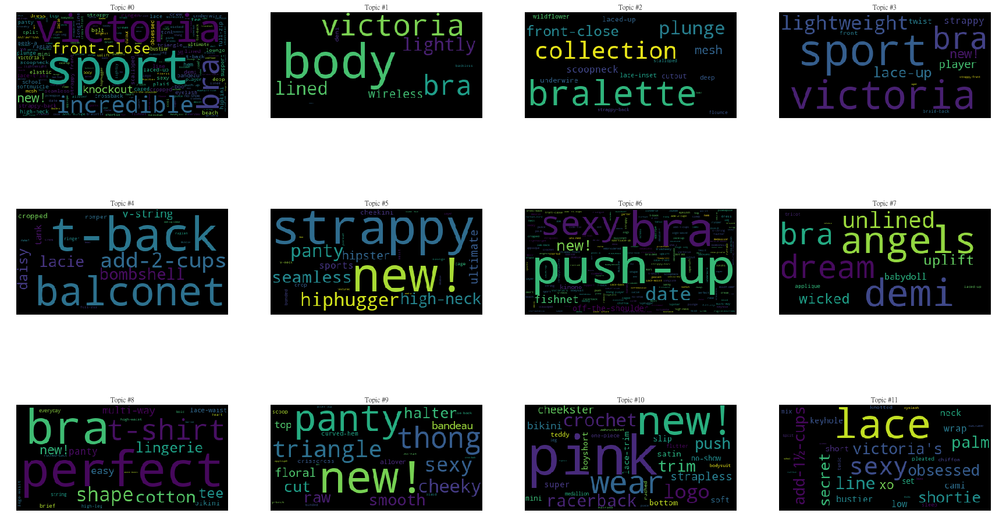

In [101]:
merged_df_victoria= merged_df[merged_df['brand_name'].str.startswith('victoria')]
docs = merged_df_victoria["product_name"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Hanky Pankyの商品名のトピック分析

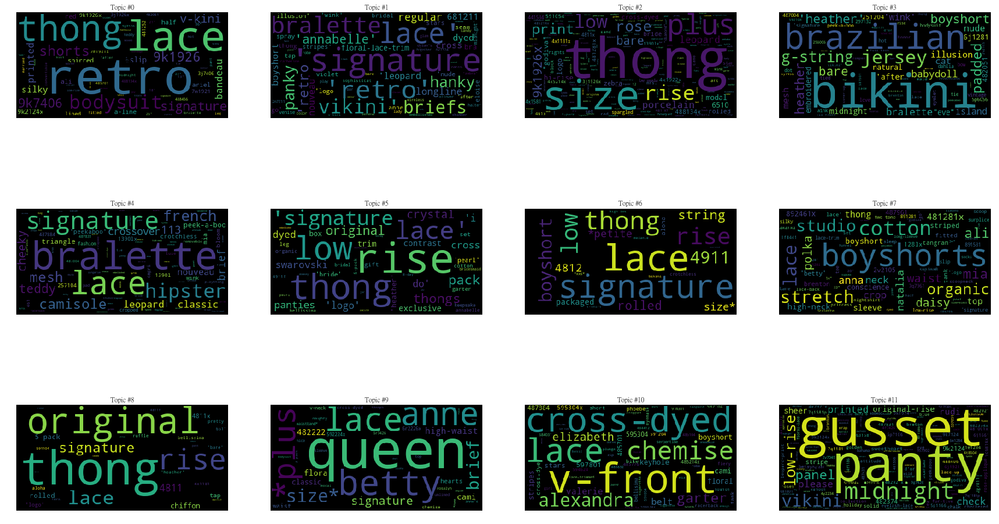

In [102]:
merged_df_hanky_panky= merged_df[merged_df['brand_name'].str.startswith('hanky panky')]
docs = merged_df_hanky_panky["product_name"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## ワコールの商品名のトピック分析

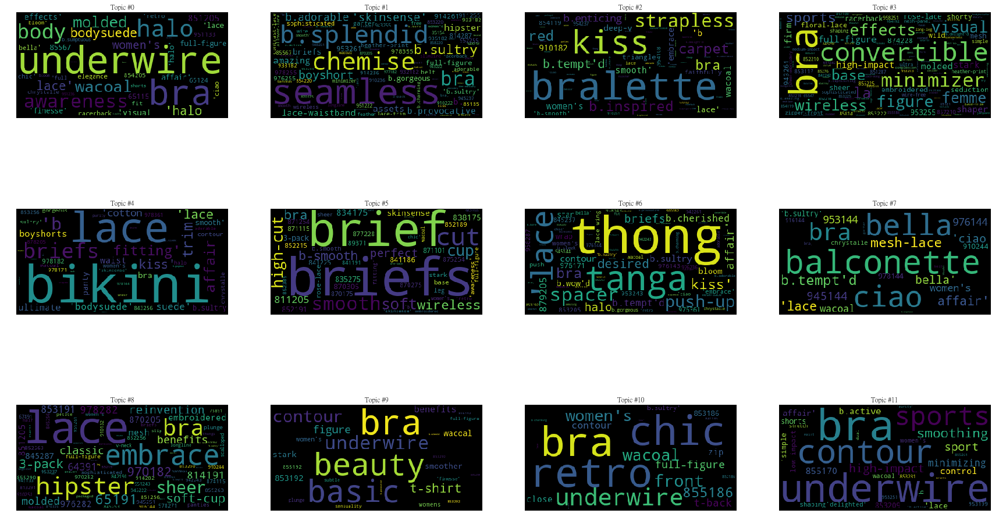

In [104]:
merged_df_wacoal= merged_df[merged_df['brand_name'].str.startswith('b.tempt')]
docs = merged_df_wacoal["product_name"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Calvin Kleinの商品名のトピック分析

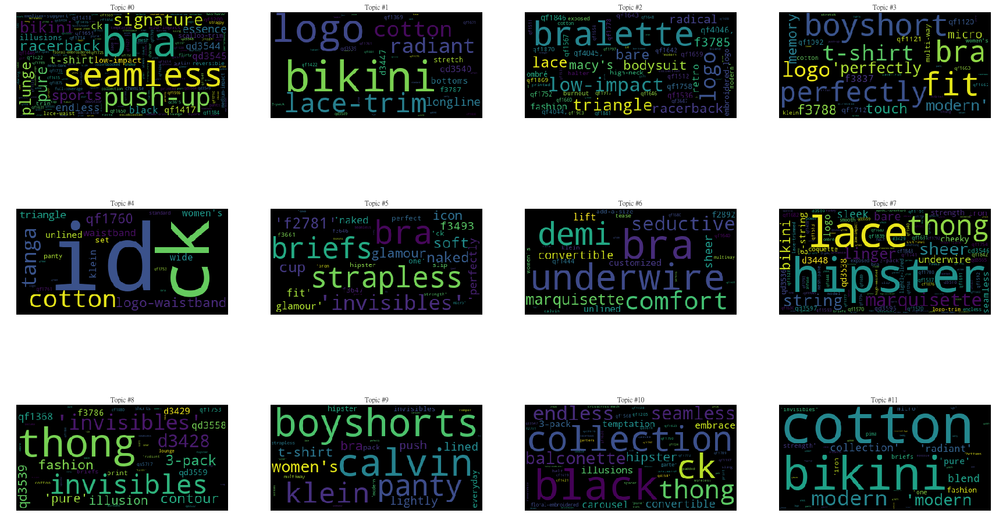

In [113]:
merged_df_calvin= merged_df[merged_df['brand_name'].str.startswith('calvin')]
docs = merged_df_calvin["product_name"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Aerieの商品名のトピック分析

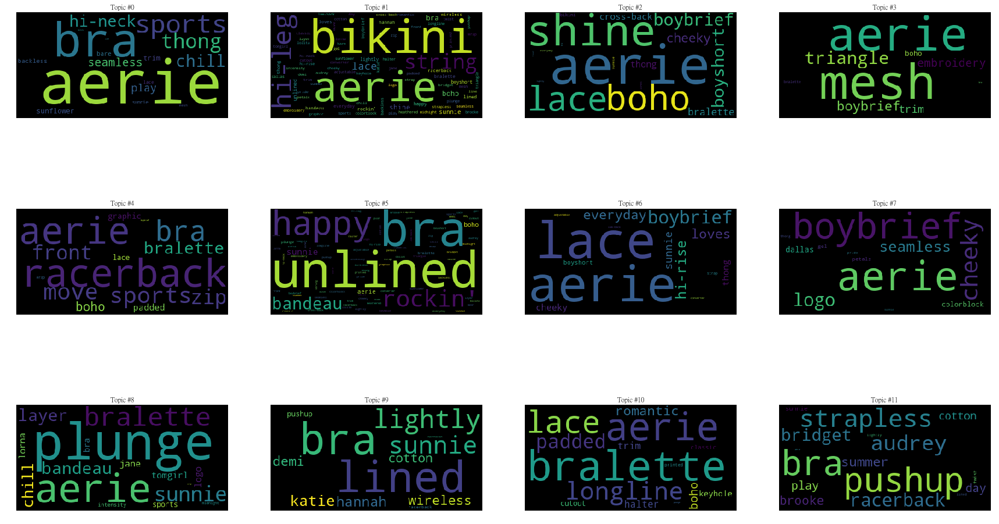

In [114]:
merged_df_aerie= merged_df[merged_df['brand_name'].str.startswith('aerie')]
docs = merged_df_aerie["product_name"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

# 商品説明のトピック分析
## 全データの商品説明のトピック分析

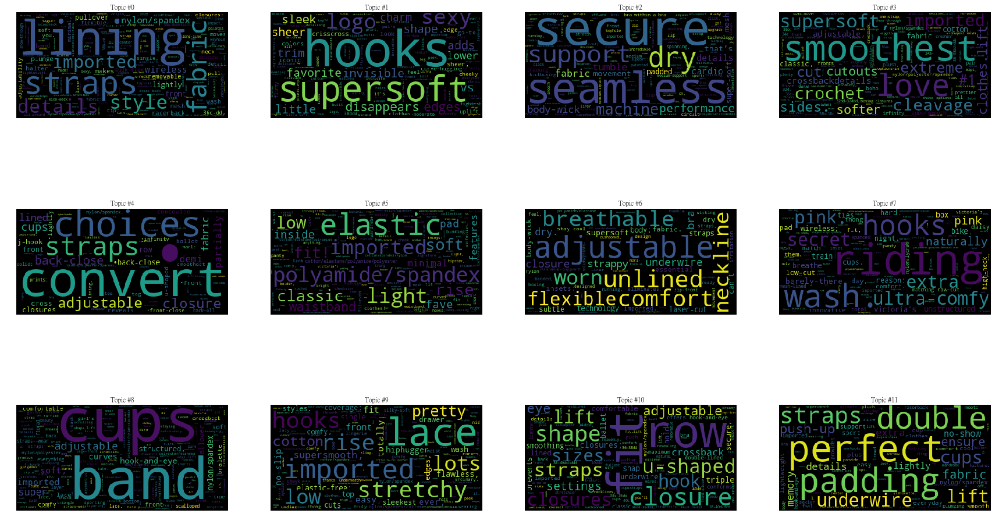

In [111]:
docs = merged_df["description"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Victoria's Secretの商品説明のトピック分析

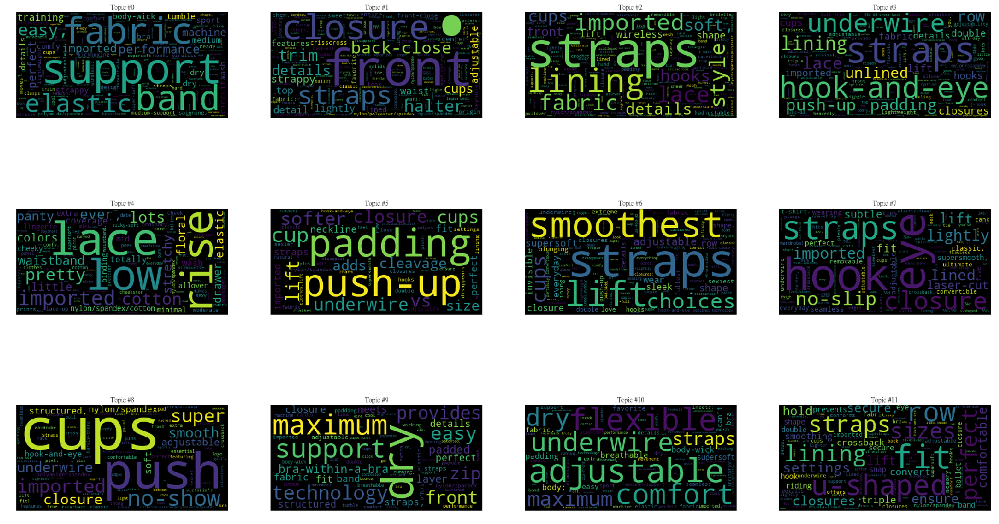

In [115]:
docs = merged_df_victoria["description"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Hanky Pankyの商品説明のトピック分析

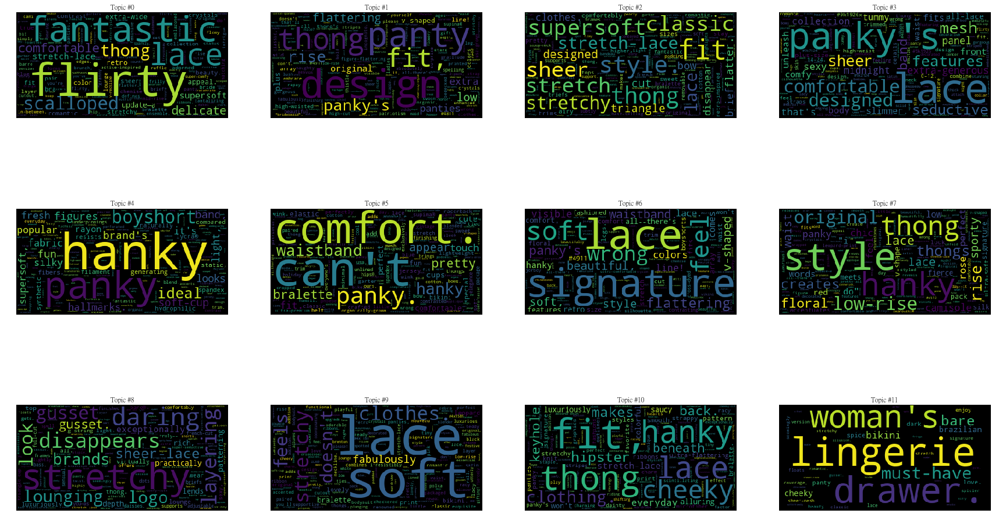

In [116]:
docs = merged_df_hanky_panky["description"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## ワコールの商品説明のトピック分析

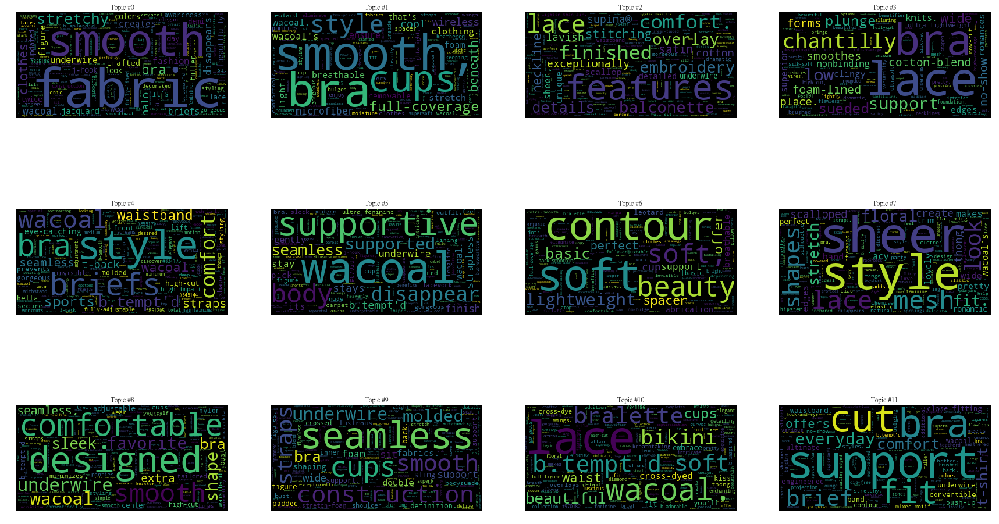

In [120]:
merged_df_wacoal= merged_df[merged_df['brand_name'].str.startswith('b.tempt')]
docs = merged_df_wacoal["description"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Calvin Kleinの商品説明のトピック分析

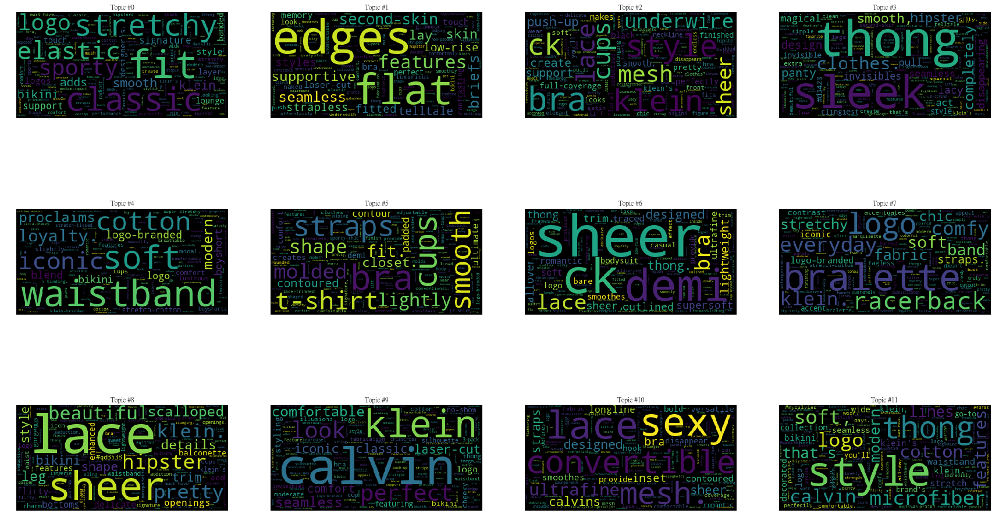

In [121]:
docs = merged_df_calvin["description"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

## Aerieの商品説明のトピック分析

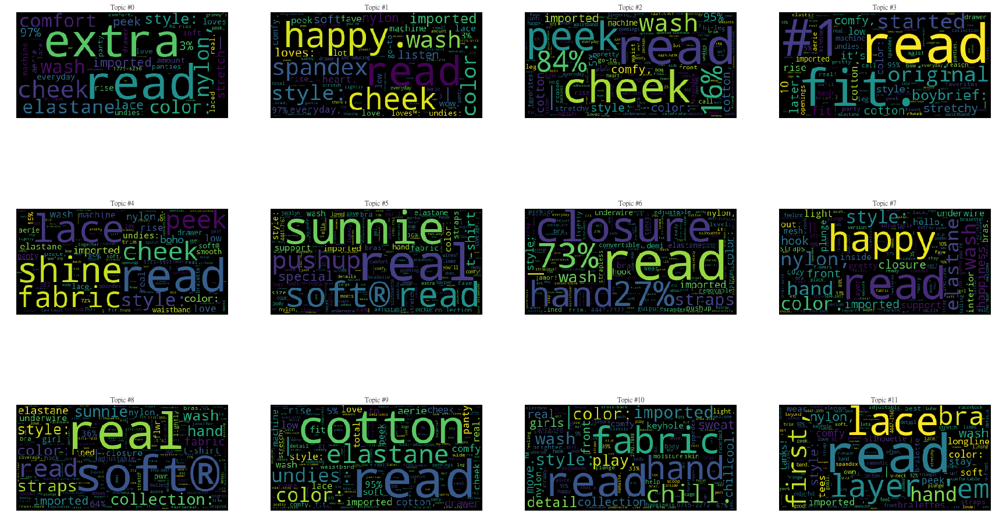

In [122]:
docs = merged_df_aerie["description"]
texts = [
    [w for w in doc.lower().split() if w not in stopwords]
        for doc in docs
]
count = Counter(w for doc in texts for w in doc)
y = [i[1] for i in count.most_common()]
dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
corpus[0]

num_topics = 12
 
lda = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    num_topics=num_topics,
    id2word=dictionary
)
plt.figure(figsize=(30,30))
for t in range(lda.num_topics):
    plt.subplot(5,4,t+1)
    x = dict(lda.show_topic(t,200))
    im = WordCloud().generate_from_frequencies(x)
    plt.imshow(im)
    plt.axis("off")
    plt.title("Topic #" + str(t))

# 各ブランドの最大小売価格(MRP)の範囲は？

Text(0.5, 1.0, '各ブランドの最大小売価格(MRP)の範囲')

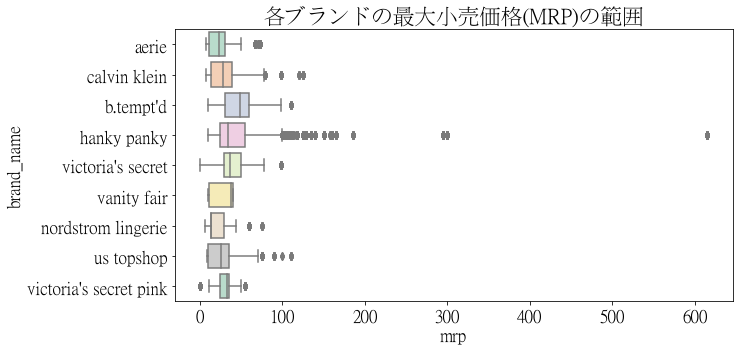

In [368]:
plt.rcParams["figure.figsize"] = (10, 5)
plt.rcParams["font.size"] = 18
sns.boxplot( x=merged_df["mrp"], y=merged_df["brand_name"], palette = "Pastel2").set_title('各ブランドの最大小売価格(MRP)の範囲')

Text(0.5, 1.0, 'officialサイト：各ブランドの最大小売価格(MRP)の範囲')

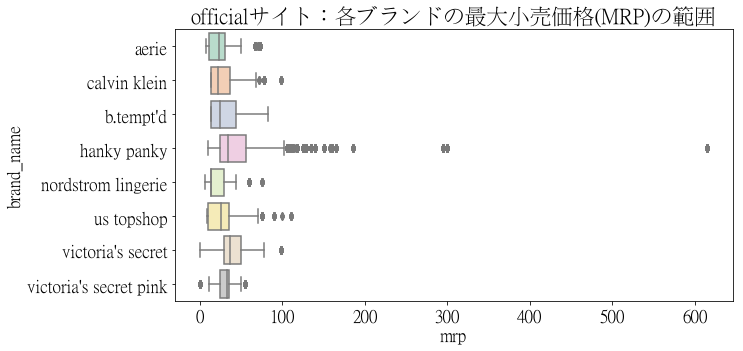

In [369]:
sns.boxplot( x=merged_df_official["mrp"], y=merged_df_official["brand_name"], palette = "Pastel2").set_title('officialサイト：各ブランドの最大小売価格(MRP)の範囲')

Text(0.5, 1.0, 'officialじゃない：各ブランドの最大小売価格(MRP)の範囲')

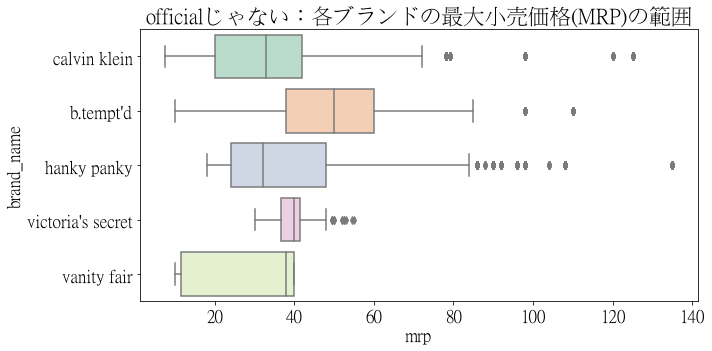

In [370]:
sns.boxplot( x=merged_df_not_official["mrp"], y=merged_df_not_official["brand_name"], palette = "Pastel2").set_title('officialじゃない：各ブランドの最大小売価格(MRP)の範囲')

Text(0.5, 1.0, 'ECサイト毎の最大小売価格(MRP)の範囲')

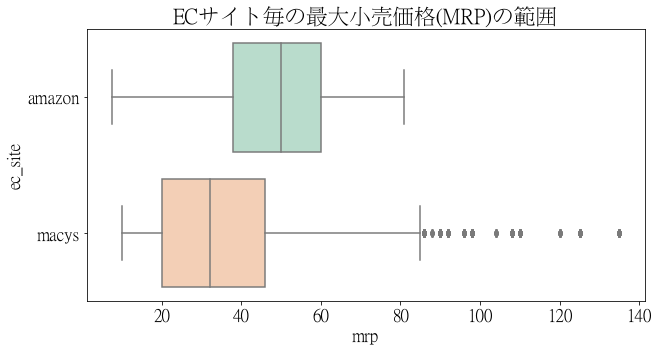

In [371]:
sns.boxplot( x=merged_df_not_official["mrp"], y=merged_df_not_official["ec_site"], palette = "Pastel2").set_title('ECサイト毎の最大小売価格(MRP)の範囲')

## 考察
・vanity fairは、最も手頃な価格のブランド<br>
・ほとんどの下着は、平均価格約30-40 USDで、最大価格200 USD以内で購入できる。<br>
・Hanky Pankyは最も高価な600USDの商品がある。<br>
・高額商品はofficialサイトで販売。<br>
・Amazonは高額商品を扱わない。<br>
・Macysは百貨店なので高額商品を扱うが、オフシャルサイトほど高額は扱わない。

# 最も高価な商品は？

In [305]:
merged_df[merged_df["mrp"] > 400]['product_name'].value_counts()

30 Pack Low Rise Thongs in Lucite Jar         25
30 Pack Original Rise Thongs in Lucite Jar    24
Name: product_name, dtype: int64

In [306]:
merged_df[merged_df["mrp"] > 400]['product_category'].value_counts()

Thongs         27
Collections    22
Name: product_category, dtype: int64

In [307]:
merged_df[merged_df["mrp"] > 400]['description'].value_counts()

For the ultimate Hanky Panky collector! This limited edition jar opens to 30 of your favorite low rise signature lace thongs. Perfect for gifting or treating yourself!         25
For the ultimate Hanky Panky collector! This limited edition jar opens to 30 of your favorite original rise signature lace thongs. Perfect for gifting or treating yourself!    24
Name: description, dtype: int64

In [308]:
merged_df[merged_df["mrp"] > 400]['style_attributes'].value_counts()

["One-size thong in our signature stretch lace ", " Fits Sizes 2-12 best (hips measuring 35\"-42\")", " Low Rise fits lower on the hips ", " The World’s Most Comfortable Thong® ", " Hanky Panky’s revolutionary and flattering V-front, V-back waistband—our signature design for over 25 years", " No visible panty line (VPL)", " Set includes the following colors: Vivid Coral, Ballet Pink, Bliss Pink, Chai, Vanilla, Buttercream, Pistachio Ice, Powder Blue, Forget Me Not, Dove Grey, Red, Sizzle Pink, Peach Smoothie, Lemoncello, Lime Sherbert, Periwinkle, True Blue, Bali Blue, Violet Crush, Hot Lilac, Enchanted Rose, Passionate Pink, Salsa, Sunkissed, Sweet Mint, Calypso, Sapphire, Electric Orchid, Electric Purple and Granite", " Body: 100% Nylon; Trim: 90% Nylon, 10% Spandex; Crotch Lining: 100% Supima® Cotton", " Made in the USA"]          25
["One-size thong in our signature stretch lace", " Fits sizes 4-14 best (hips measuring 36\"-45\") ", " Original Rise fits higher on the hips ", " The 

In [309]:
merged_df[merged_df["mrp"] > 400]['total_sizes'].value_counts()

["One Size"]              41
["Select", "One Size"]     8
Name: total_sizes, dtype: int64

In [310]:
merged_df[merged_df["mrp"] > 400]['available_size'].value_counts()

["One Size"]              41
["Select", "One Size"]     8
Name: available_size, dtype: int64

In [311]:
merged_df[merged_df["mrp"] > 400]['color'].value_counts()

Rainbow    49
Name: color, dtype: int64

In [312]:
merged_df[merged_df["mrp"] > 400]['product_group'].value_counts()

panty    27
bra      22
Name: product_group, dtype: int64

## 高額商品の考察
<img src="https://www.hankypanky.com/media/catalog/product/cache/1/image/db978388cfd007780066eaab38556cef/4/8/481143_mxbq_2_1.jpg">
・高額商品は紐パンツのセット販売<br>
・色は虹色とあるが、花束のような形でギフトとして販売している。

## ECサイトで高額な紐パンツが売れる理由は？
・男性が女性にプレゼントする際に、実店舗で買うと恥ずかしいが、ネットなら恥ずかしくない。<br>
・形状がひもならサイズもoneサイズで良い。<br>
・プレゼントの仕方もアレンジすれば嫌らしくない。

# 商品カテゴリ毎の各ブランドの最大小売価格(MRP)の範囲は？

In [313]:
plt.rcParams["figure.figsize"] = (10, 5)

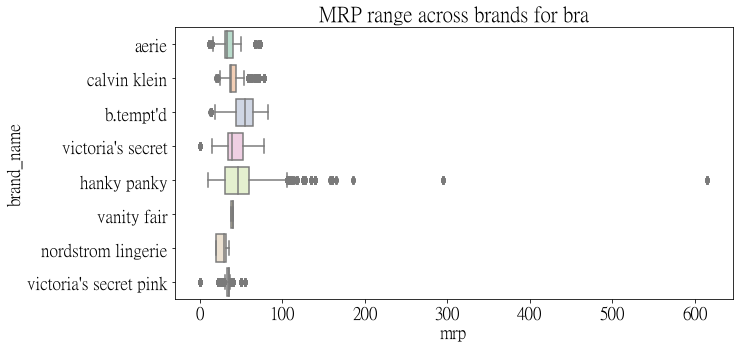

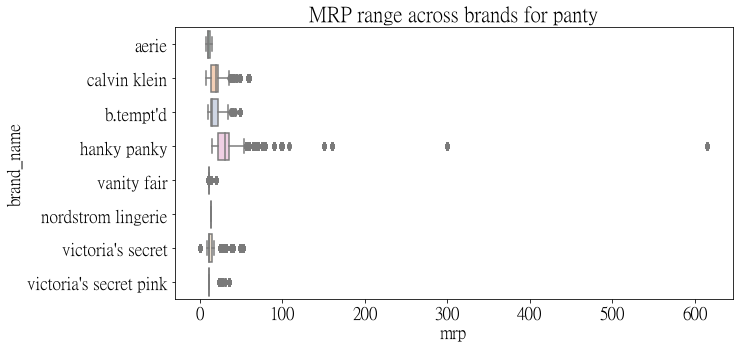

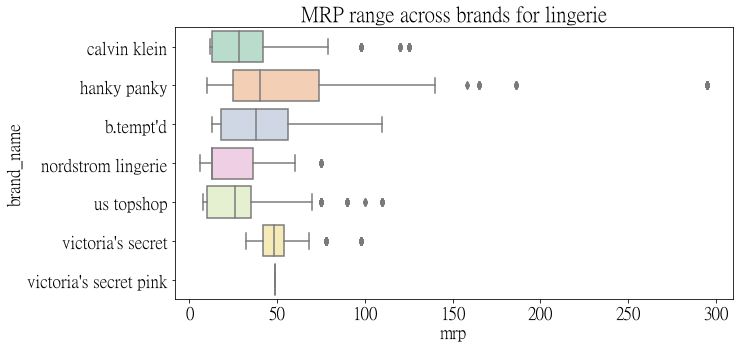

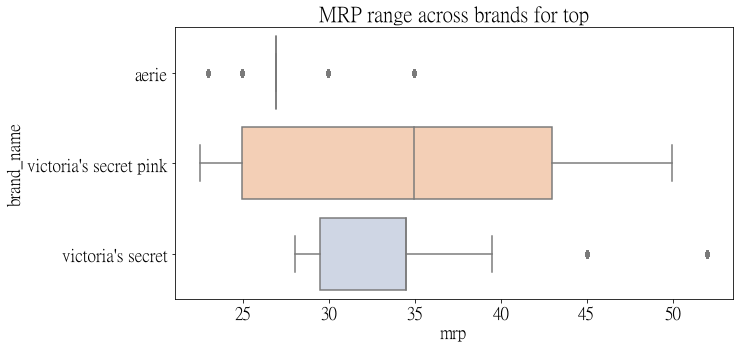

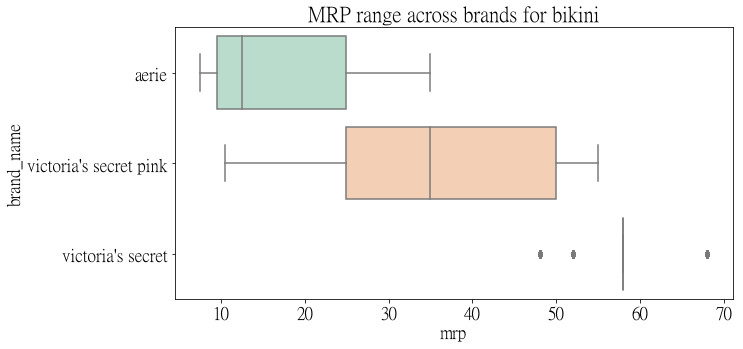

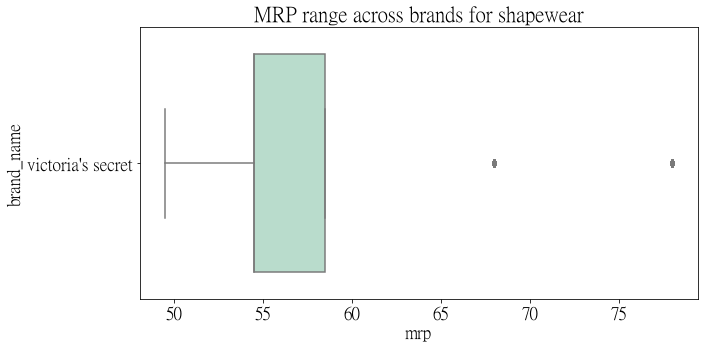

In [314]:
import matplotlib as plt
from matplotlib import *

product_group = pd.value_counts(merged_df['product_group'])

for item in product_group.iteritems():
    category = item[0]
    
    product_group_df = merged_df[merged_df["product_group"] == category]
    plt.pyplot.figure()
    title = "MRP range across brands for "+ category 
    sns.boxplot( x=product_group_df["mrp"], y=product_group_df["brand_name"], palette = "Pastel2").set_title(title)

## 考察
・ブラジャーとパンティーで多くのブランドが勝負している。

# ブランド間で展開している色の範囲は？

In [315]:
pd.value_counts(merged_df["color"])

Black                                      36913
White                                      18068
black                                      13121
pure black                                  7083
Ensign                                      6738
Almost Nude                                 6271
bayberry                                    5438
Hello Lovely                                5159
Sheer Pink                                  4985
Radiating Aztec                             4861
Black Marl                                  4735
buff                                        4554
Burnished Lilac                             4518
True Black                                  4385
triumph white                               4261
Naturally Nude                              4027
Ivory                                       3520
coconut white                               3488
Black Lace                                  3427
white                                       3264
Navy                

### 色の種類が多すぎるために大きな色カテゴリを作成

In [316]:
categories = {
    "green" : ["green", "emerald", "fir", "bayberry"],
    "blue" : ["blue", "navy", "teal", "denim", "azure", "celeste", "turkish", "sea"],
    "white" : ["white", "ivory", "cashew", "coconut", "marshmallow"],
    "black" : ["black", "midnight", "night"],
    "red": ["red", "candy apple", "ginger glaze", "plum", "maroon", "ruby","cherry", "strawberry"],
    "yellow": ["yellow", "gold"],
    "orange" : ["orange"],
    "pink": ["pink", "rosewater", "fuschia", "blush", "peach", "lotus"],
     "nude" : ["nude", "bare", "champagne"],
    "gray" : ["gray", "grey", "pewter", "slate", "silver"],
    "brown" : ["brown", "taupe", "chai", "cappuccino", "sienna", "toast", "french roast"],
    "maroon" : ["maroon"],
    "purple" : ["mauve", "lilac", "purple", "violet", "grape"]  
}

black                                  115227
white                                   69733
blue                                    52789
pink                                    51950
red                                     42730
nude                                    30987
purple                                  27603
green                                   22306
gray                                    19548
brown                                   15340
ensign                                   7819
buff                                     5802
hello lovely                             5159
radiating aztec                          4861
yellow                                   3872
lip smacker lace                         1890
laced arrows                             1811
trilobel marl                            1780
neon sunset logo print                   1774
cocoon                                   1721
ensign lace mix                          1699
dazzle                            

There are 834 categories! 


/Users/hikaru_no_5_0208/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.


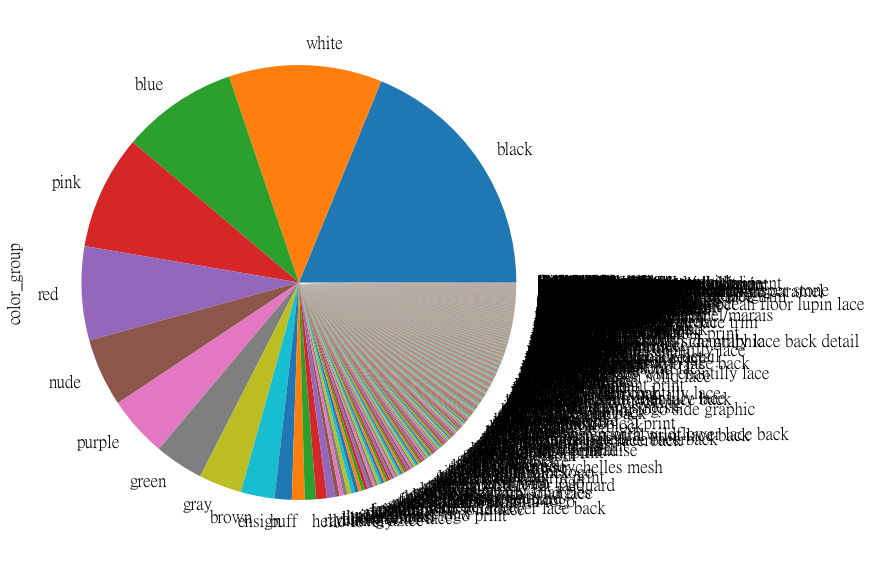

In [317]:
def standardize_color_group(color):
    color_category = color
    
    try:
        color_category = color_category.lower()

        for group, items in categories.items():
            for item in items:
                if item in color_category:
                    return group
    except:
        print(color_category)
        
    return color_category

merged_df['color'] = merged_df['color'].fillna('unknown')
merged_df["color_group"] = merged_df['color'].apply(standardize_color_group)

color_group = pd.value_counts(merged_df['color_group'])
display(color_group)
print("There are %d categories! "% (color_group.shape[0]))
color_group.plot.pie(figsize=(10,10))
color_group.to_csv('color_mania.csv')

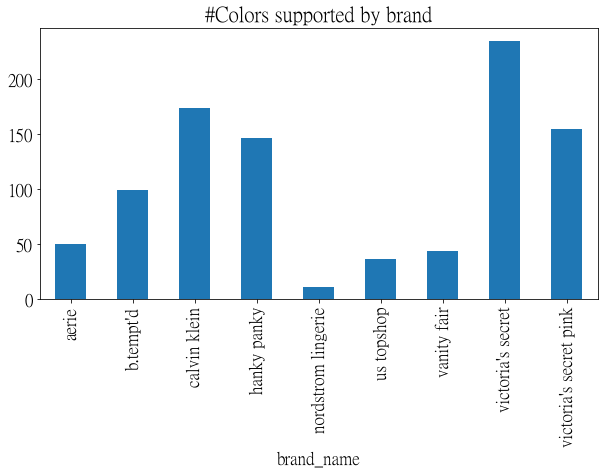

In [318]:
merged_df.groupby(["brand_name"])["color_group"].nunique().plot.bar(title='#Colors supported by brand')

Text(0.5, 0, '#colors per product type')

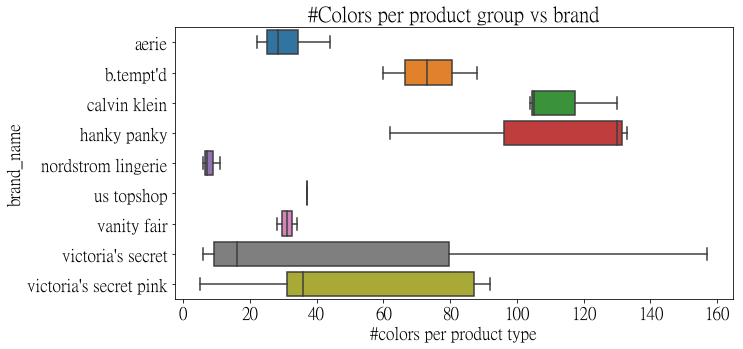

In [319]:
color_count_df = merged_df.groupby(["brand_name", "product_group"]).color_group.nunique()
color_count_df = color_count_df.reset_index()
plot = sns.boxplot(x='color_group', y='brand_name', data=color_count_df)
plot.set_title("#Colors per product group vs brand")
plot.set_xlabel('#colors per product type')

In [320]:
merged_df.groupby('brand_name').product_name.agg(['count', 'nunique'])

,count,nunique
brand_name,,
aerie,28256,106
b.tempt'd,45130,395
calvin klein,31126,442
hanky panky,48184,896
nordstrom lingerie,864,23
us topshop,3041,296
vanity fair,2568,46
victoria's secret,342542,429
victoria's secret pink,110546,172


# 商品カテゴリ毎の色の範囲は？

Text(0, 0.5, '#colors for product group')

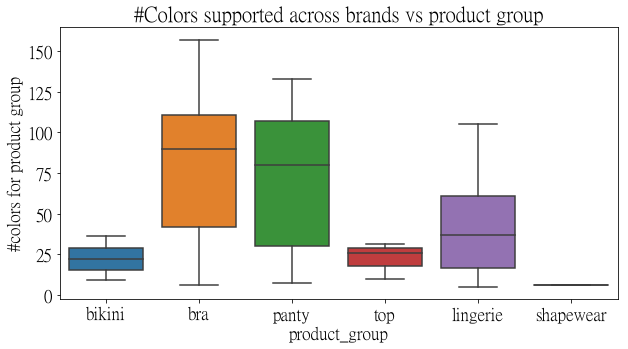

In [321]:
plot = sns.boxplot(x='product_group', y='color_group', data=color_count_df)
plot.set_title("#Colors supported across brands vs product group")
plot.set_ylabel('#colors for product group')

## 考察
・各ブランドで様々な色を用意している

# ブランド間での評価は？

In [322]:
pd.value_counts(merged_df['rating'])

4.4    37103
4.3    29563
4.5    25065
5.0    20133
4.2    17798
4.0    17781
4.6    13444
4.7     8820
3.7     8673
3.9     8033
4.1     7790
3.8     7504
4.8     6741
3.6     5060
3.2     4300
4.9     3380
3.3     2827
3.5     2471
3.0     2133
1.0     1184
2.0      509
3.1      503
3.4      459
2.9      448
2.8      360
2.6      339
2.5      244
2.7      161
1.5      160
0.0      124
2.4       52
2.3       34
2.2        8
2.1        8
1.7        8
Name: rating, dtype: int64

## 考察
・評価(rating)は1.0 から5.0の値

Text(0, 0.5, 'Brand')

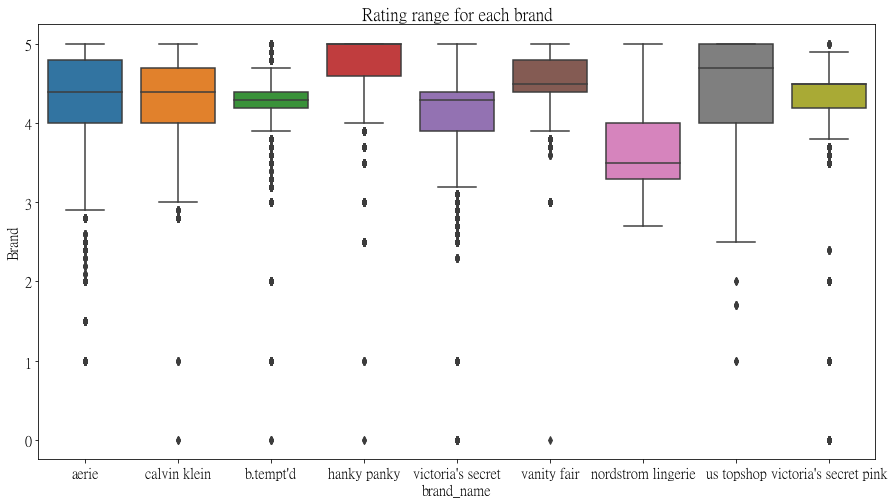

In [323]:
pyplt.figure(figsize=(15,8))
plt.rcParams["font.size"] = 15
plot = sns.boxplot(x='brand_name', y='rating', data=merged_df)
plot.set_title("Rating range for each brand")
plot.set_ylabel('Brand')

In [324]:
merged_df.columns

Index(['product_name', 'mrp', 'price', 'pdp_url', 'brand_name',
       'product_category', 'retailer', 'description', 'rating', 'review_count',
       'style_attributes', 'total_sizes', 'available_size', 'color',
       'product_group', 'color_group'],
      dtype='object')

## 考察
・Nordstromの評価は悪い。<br>
・victoria's secretはHanky Pankyより評価が低い。しかし在庫が多いたのが影響しているかも。<br>
・Hanky Pankyの評価は高い。

# 商品カテゴリ毎のブランド間での評価は？

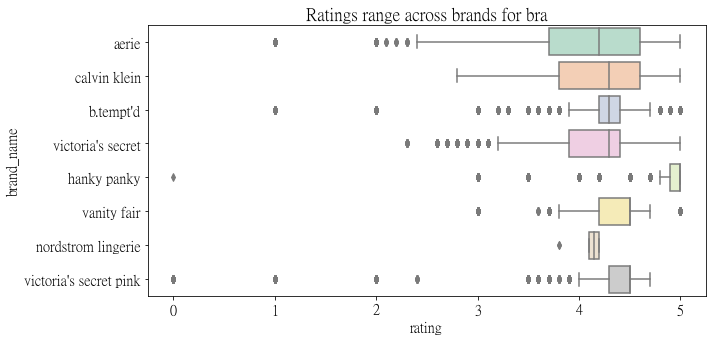

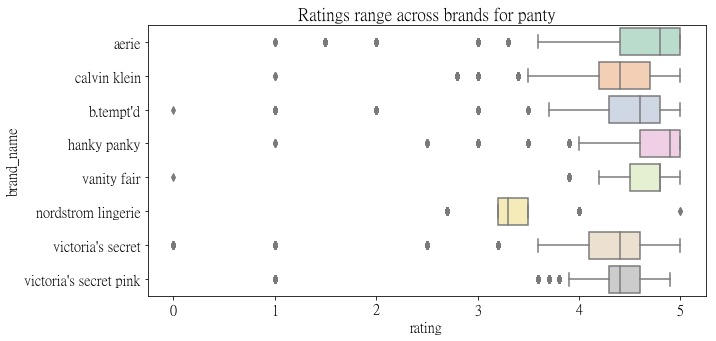

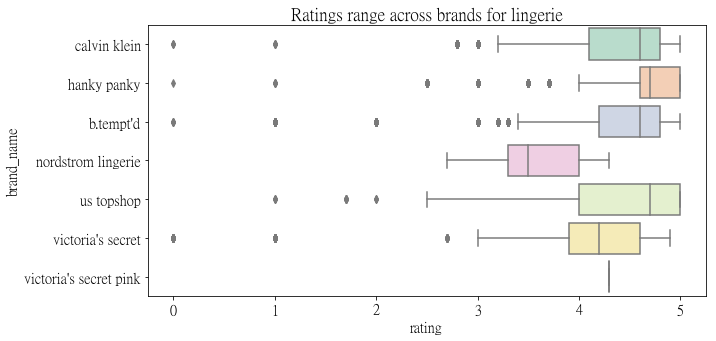

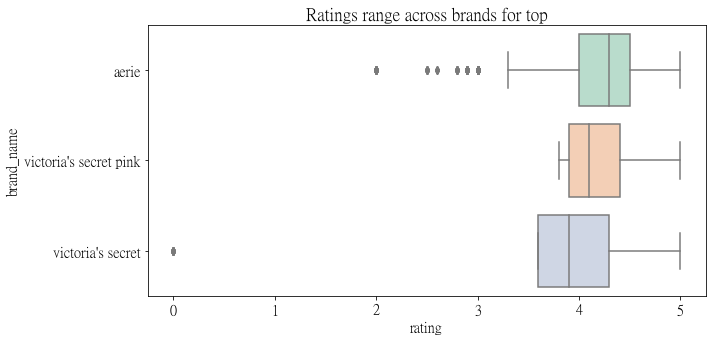

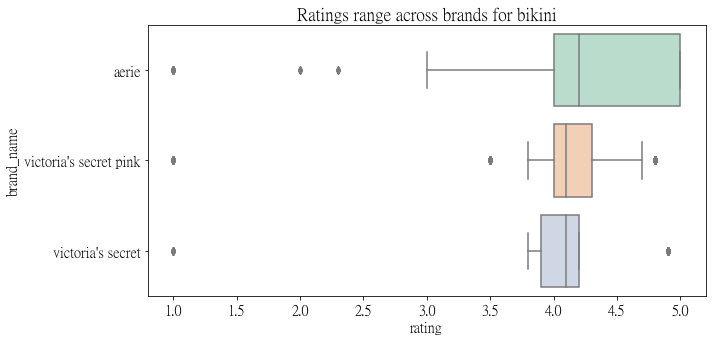

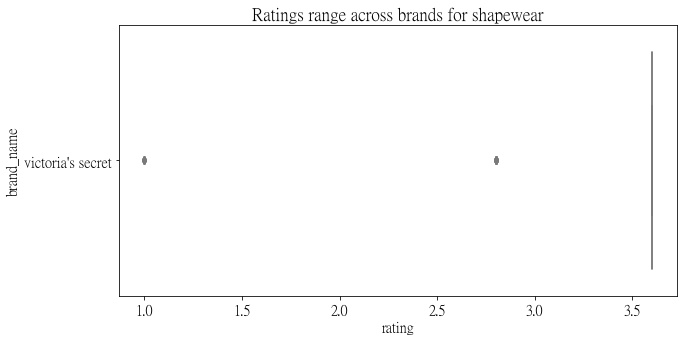

In [325]:
product_group = pd.value_counts(merged_df['product_group'])

for item in product_group.iteritems():
    category = item[0]
    
    product_group_df = merged_df[merged_df["product_group"] == category]
    plt.pyplot.figure()
    title = "Ratings range across brands for "+ category 
    sns.boxplot( x=product_group_df["rating"], y=product_group_df["brand_name"], palette = "Pastel2").set_title(title)

## 考察
・Hanky Pankyはパンティとブラジャーで評価が高い。<br>
・Victoria Secretsの評価はNordstrom以外の全ブランドより悪い。

# 最も割引されているブランドは何か？

Text(0, 0.5, 'Brand')

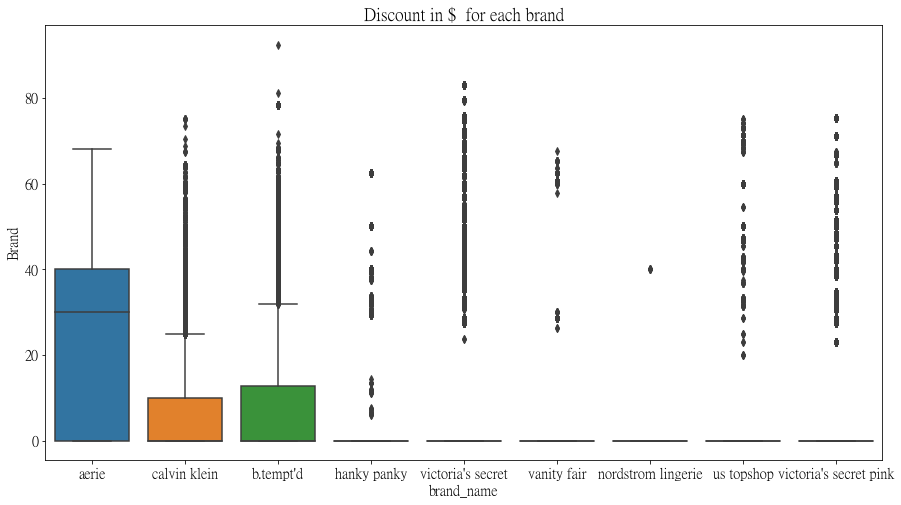

In [326]:
merged_df['discount'] = merged_df['mrp'] - merged_df['price']
merged_df['discount%'] = merged_df['discount'] *100 / merged_df['mrp']
pyplt.figure(figsize=(15,8))
plot = sns.boxplot(x='brand_name', y='discount%', data=merged_df)
plot.set_title("Discount in $  for each brand")
plot.set_ylabel('Brand')

## 考察
・AerieとCalvin KleinとB'Temptdは日常的に割引している。<br>
・少量だが非常に大きな割引で購入できる商品がある。

# 商品カテゴリ毎に最も割引されているブランドは何か？

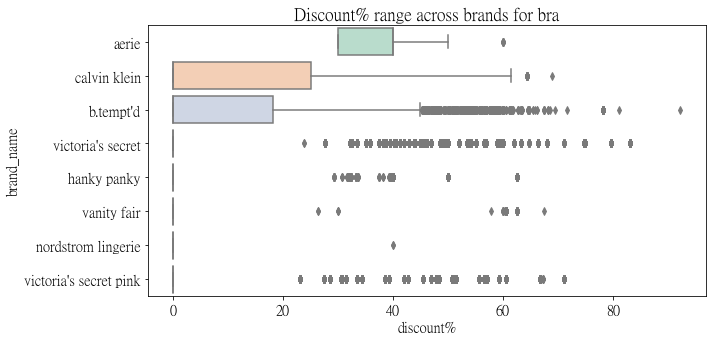

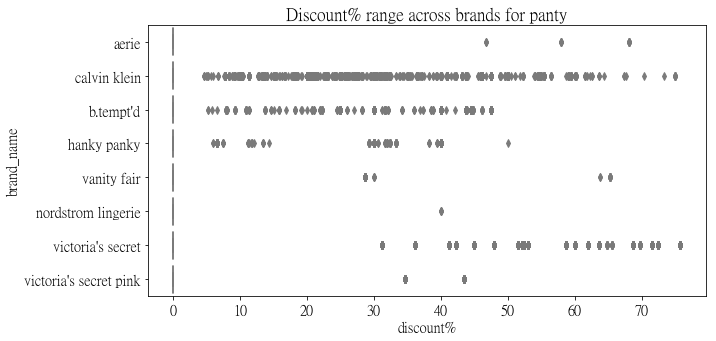

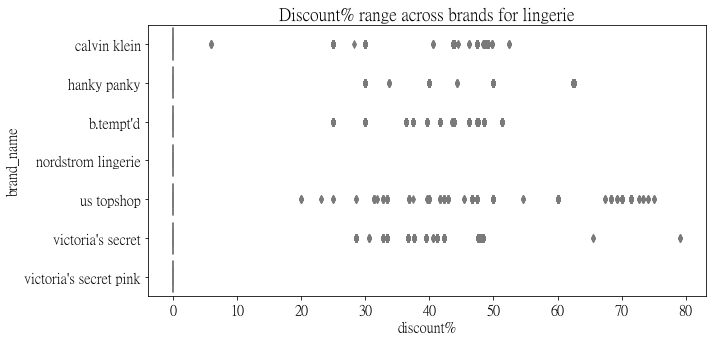

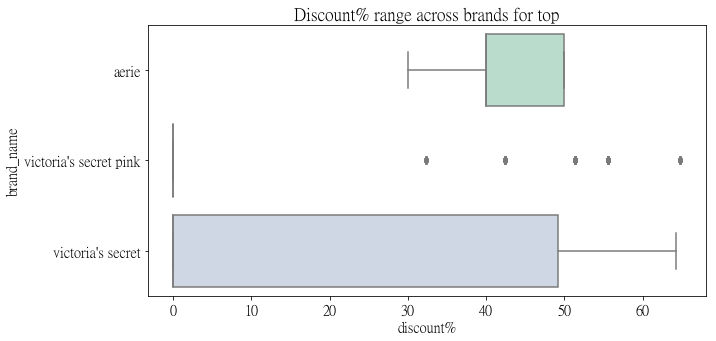

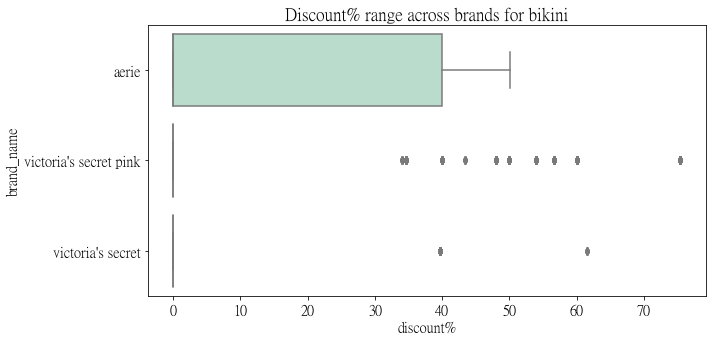

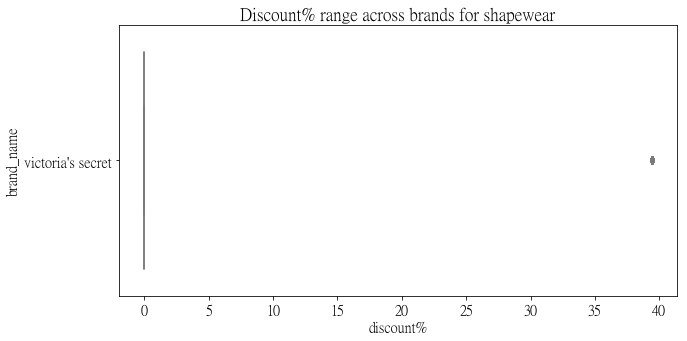

In [327]:
for item in product_group.iteritems():
    category = item[0]
    
    product_group_df = merged_df[merged_df["product_group"] == category]
    plt.pyplot.figure()
    title = "Discount% range across brands for "+ category 
    sns.boxplot( x=product_group_df["discount%"], y=product_group_df["brand_name"], palette = "Pastel2").set_title(title)

## 考察
・ほとんどブランドが大幅な値引きをしている。<br>
・Calvin Kleinはパンティーを大幅に割引していますが、ブラジャーはそれほど多くない。<br>
・Hanky Pankyもいくらか割引がある。